In [1]:
import warnings

warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=DeprecationWarning)

import os, re, gc, joblib
import numpy as np
import pandas as pd
import scipy.sparse as sp
from sklearn.decomposition import PCA

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib import rcParams

rcParams["pdf.fonttype"] = 42
rcParams["ps.fonttype"] = 42

import seaborn as sns
import plotnine as pln

warnings.simplefilter("ignore", category=pln.exceptions.PlotnineWarning)

import anndata
import scanpy as sc
import sctk as sk

import sklearn

np.set_printoptions(linewidth=180)
sc.settings.verbosity = 0
sk.set_figsize((4, 4))

In [2]:
def check_stat(cnmf_out_prefix, K):
    stat_df = pd.concat(
        [
            pd.read_csv(f"{cnmf_out_prefix}.stats.k_{k}.consensus.csv", index_col=0).T
            for k in K
            if os.path.exists(f"{cnmf_out_prefix}.stats.k_{k}.consensus.csv")
        ],
        axis=0,
        ignore_index=True,
    )
    stat_df["k"] = stat_df.k.astype(int)
    stat_df["prediction_error"] = stat_df["prediction_error"] / 1e7

    return stat_df

In [3]:
def plot_k_stat(stat_df):
    '''Plot prediction vs stability. Like ggplot with plotnine. returns plotnine object.'''
    pln.options.figure_size = (4, 4)
    plot = (
        pln.ggplot(stat_df, pln.aes(x="prediction_error", y="stability", label="k"))
        + pln.geom_line()
        + pln.geom_point()
        + pln.geom_text(nudge_x=0.01, nudge_y=0.002)
        + pln.theme_bw()
    )
    
    return(plot)

In [4]:
def examine_k(cnmf_out_prefix, k, adata=None, plot=False, n_top_genes=10):
    usage_df = pd.read_csv(
        f"{cnmf_out_prefix}.usage.k_{k}.consensus.csv.gz",
        index_col=0,
        names=[f"p{i+1}" for i in range(k)],
        skiprows=1,
    )

    spectra_df = pd.read_csv(
        f"{cnmf_out_prefix}.spectra.k_{k}.consensus.csv.gz",
        index_col=0,
    )

    top_k_inds = np.argsort(spectra_df.values)[:, -1 : -(n_top_genes + 1) : -1]

    norm_usage_df = usage_df / usage_df.sum(axis=0).values.reshape(1, k)

    if adata:
        adata.obs[f"cNMF_{k}program"] = np.argmax(norm_usage_df.values, axis=1)
        adata.obs[f"cNMF_{k}program"] = adata.obs[f"cNMF_{k}program"].astype("category")

        if plot:
            sk.clear_colors(adata)
            sk.plot_embedding(adata, basis="umap", groupby=f"cNMF_{k}program", annot="full")

    return pd.DataFrame(spectra_df.columns[top_k_inds], index=spectra_df.index)

# Gene accessibility factors

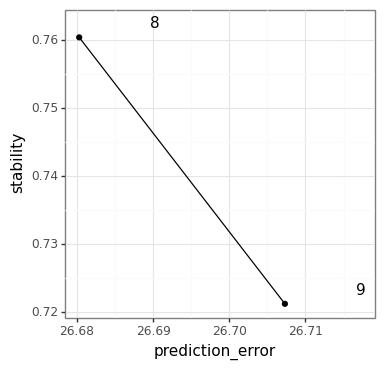

<ggplot: (8788616717388)>

In [5]:
K = [8, 9]

stat_df = check_stat("cNMF_atacG/cNMF_atacG_fibro", K)

plot_k_stat(stat_df)

# Peak accessibility factors

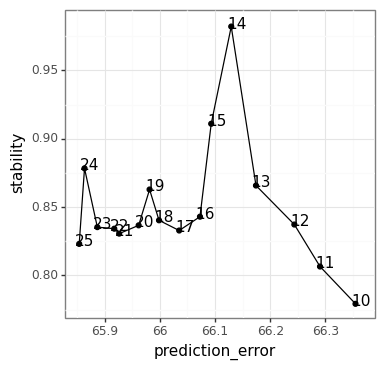

In [6]:
K = [10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]

stat_df = check_stat("cNMF_atacP/cNMF_atacP", K)

plot = plot_k_stat(stat_df)
print(plot)
plot.save('figures/ATAC_cNMF_selectK.pdf')


In [7]:
k = 14
#k = 19 

# Load factor usage table
usage = pd.read_csv(
        f"cNMF_atacP/cNMF_atacP.usage.k_{k}.consensus.csv.gz",
        index_col=0,
        names=[f"cNMF_{i+1}" for i in range(k)],
        skiprows=1,
    )
# normalize rows to 1
usage = usage.div(usage.sum(axis=1), axis=0)  # note this is different from Ni's orgininal normalization


In [8]:
# load peak matrix AnnData object
adata = sc.read_h5ad("../fibroblast_reanalysis/data/scATAC_PeakMatrix_fibro.processed.h5ad")

In [9]:
# Write annotated and normalized cNMF usage
usage_annot = adata.obs[['annot1']].join(usage)
usage_annot.to_csv("data/ATACseq_cNMF_usage_k" + str(k) + ".csv")

In [10]:
# merge cNMF programs by index
adata.obs = adata.obs.join(usage)

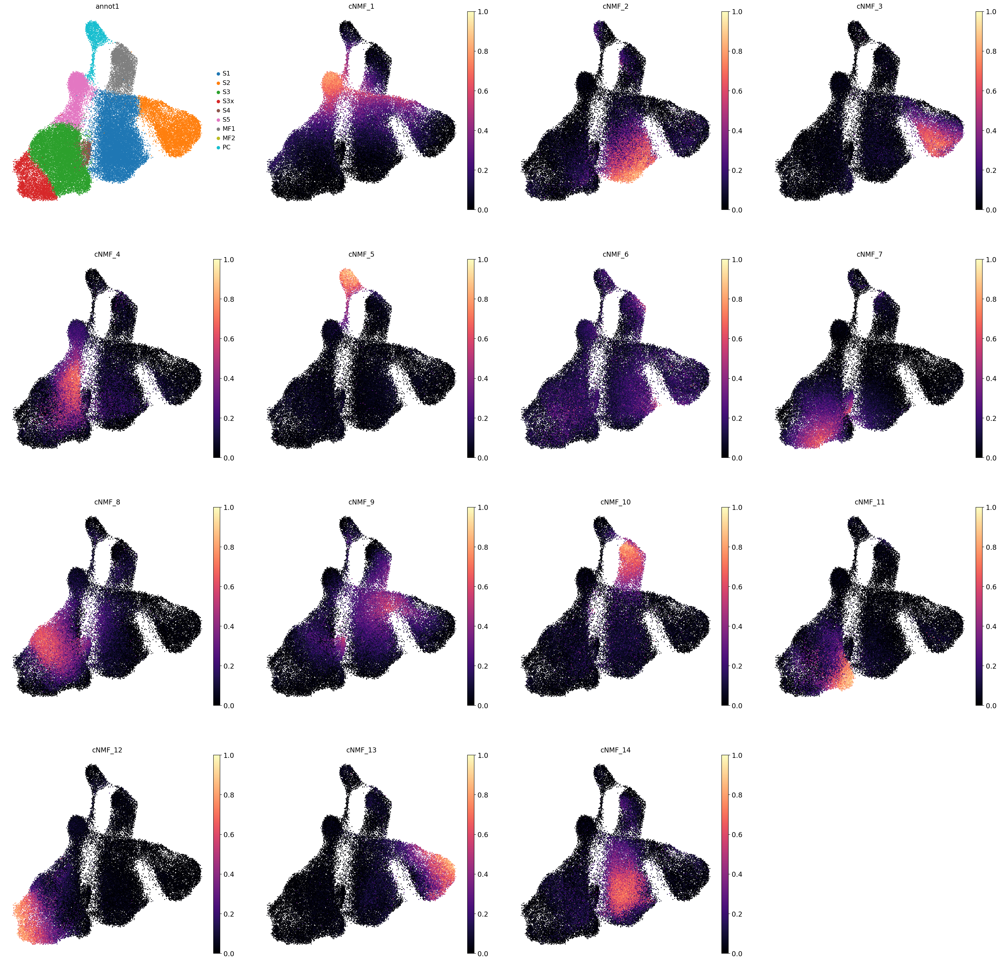

In [11]:
# UMAP plots colored by cNMF usage
sc.set_figure_params(dpi_save=150, figsize=(8, 8))

# without outline
sc.pl.umap(
    adata,
    color=['annot1'] + usage.columns.to_list(),
    palette='tab10',
    cmap='magma',
    frameon=False,
    vmax=1.0,
    vmin=0.0,
    size=15,  # point size
    save='_fibroblasts_ATACseq_cNMF_usage.pdf'  # in ./figures
)

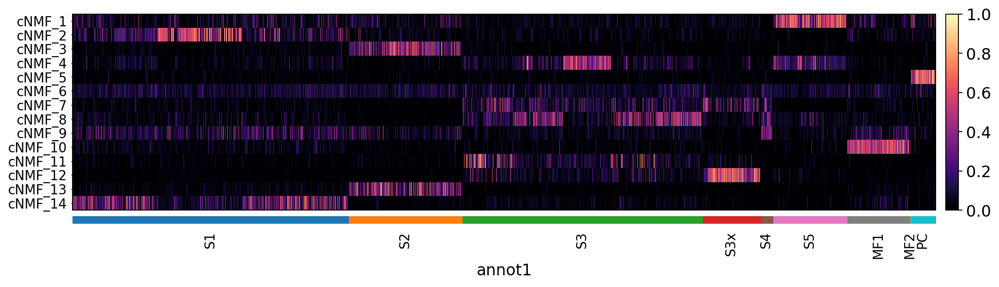

In [12]:
# Heatmap of cNMF usage by cell type
#sc.tl.dendrogram(adata, groupby='annot1')  # does not work
sc.set_figure_params(dpi_save=300)
sc.pl.heatmap(
    adata,
    var_names=usage.columns,
    groupby='annot1',
    #dendrogram=True,
    swap_axes=True,
    cmap="magma",
    figsize=(14, 3.5),
    save="_fibroblasts_ATACseq_cNMF_usage.pdf"
)

In [13]:
adata.X

<56689x407383 sparse matrix of type '<class 'numpy.float32'>'
	with 435138921 stored elements in Compressed Sparse Row format>

In [14]:
adata

AnnData object with n_obs × n_vars = 56689 × 407383
    obs: 'BlacklistRatio', 'DoubletEnrichment', 'DoubletScore', 'nDiFrags', 'nFrags', 'nMonoFrags', 'nMultiFrags', 'NucleosomeRatio', 'PromoterRatio', 'ReadsInBlacklist', 'ReadsInPromoter', 'ReadsInTSS', 'Sample_x', 'TSSEnrichment', 'Clusters', 'predictedCell_Un', 'predictedGroup_Un', 'predictedScore_Un', 'predictedCell_Co', 'predictedGroup_Co', 'predictedScore_Co', 'Clusters_hm', 'predictedCell_Un_hm', 'predictedGroup_Un_hm', 'predictedScore_Un_hm', 'predictedCell_Co_hm', 'predictedGroup_Co_hm', 'predictedScore_Co_hm', 'predictedCell', 'predictedGroup', 'predictedScore', 'Annot', 'Clusters1', 'ReadsInPeaks', 'FRIP', 'GEX_SID', 'ATAC_SID', 'GEX', 'ATAC', 'Sample_y', 'DOB', 'Gender', 'date', 'age_years', 'state', 'disease', 'site_taken_fine', 'site_taken_broad', 'sorted', 'Nancy_histologic_score', 'slide_look_other', 'whole_tissue_signature', 'scSeq', 'bulkSeq', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 

# Analysis of cNMF spectra

In [15]:
# Top peaks per factor
# cnmf_atacP_top50peaks = examine_k(
#     "cNMF_atacP/cNMF_atacP", k=14, adata=adata, plot=False, n_top_genes=50
# )

In [16]:
# cnmf_atacP_top50peaks

In [17]:
# Load spectra
spectra_df = pd.read_csv(
    f"cNMF_atacP/cNMF_atacP.spectra.k_{k}.consensus.csv.gz",
    index_col=0,
)
spectra_df

,"chr1:827241-827741,LINC00115,Promoter","chr1:943047-943547,NOC2L,Exonic","chr1:978274-978774,PERM1,Intronic","chr1:981361-981861,PERM1,Intronic","chr1:982564-983064,PERM1,Promoter","chr1:984074-984574,PERM1,Distal","chr1:1032894-1033394,AGRN,Intronic","chr1:1375159-1375659,AURKAIP1,Promoter","chr1:1622183-1622683,MIB2,Intronic","chr1:1658922-1659422,CDK11B,Promoter",...,"chrX:152941405-152941905,ZNF185,Intronic","chrX:152958770-152959270,PNMA5,Intronic","chrX:153468145-153468645,TREX2,Intronic","chrX:153474689-153475189,BGN,Intronic","chrX:153488240-153488740,BGN,Intronic","chrX:153533131-153533631,ATP2B3,Intronic","chrX:153687692-153688192,SLC6A8,Promoter","chrX:153688442-153688942,PNCK,Exonic","chrX:154917965-154918465,SMIM9,Intronic","chrX:155009942-155010442,FUNDC2,Intronic"
1,0.000119,0.000000,0.000029,0.000000,0.000000,0.000040,0.000132,0.000163,0.000018,0.000061,...,0.000109,0.000151,0.000000,0.000069,0.000000,1.500777e-05,0.000076,0.000030,0.000071,0.000000
2,0.000044,0.000013,0.000000,0.000000,0.000000,0.000000,0.000055,0.000062,0.000000,0.000000,...,0.000052,0.000031,0.000146,0.000000,0.000023,1.623227e-05,0.000031,0.000052,0.000048,0.000000
3,0.000046,0.000028,0.000015,0.000019,0.000000,0.000024,0.000024,0.000083,0.000003,0.000092,...,0.000038,0.000024,0.000233,0.000047,0.000174,1.533097e-04,0.000037,0.000047,0.000032,0.000000
4,0.000017,0.000152,0.000002,0.000062,0.000043,0.000072,0.000054,0.000111,0.000000,0.000198,...,0.000056,0.000042,0.000090,0.000071,0.000030,3.526957e-05,0.000079,0.000058,0.000103,0.000000
5,0.000135,0.000000,0.000164,0.000069,0.000040,0.000137,0.000166,0.000180,0.000000,0.000107,...,0.000113,0.000106,0.000000,0.000080,0.000516,0.000000e+00,0.000064,0.000000,0.000016,0.000033
6,0.000429,0.000391,0.000272,0.000325,0.000272,0.000426,0.000451,0.000789,0.000000,0.000625,...,0.000551,0.000506,0.000038,0.000323,0.000024,0.000000e+00,0.000505,0.000468,0.000229,0.000000
7,0.000061,0.000068,0.000000,0.000000,0.000000,0.000000,0.000000,0.000152,0.000037,0.000071,...,0.000148,0.000122,0.000042,0.000015,0.000045,3.988328e-05,0.000037,0.000000,0.000161,0.000286
8,0.000128,0.000068,0.000130,0.000141,0.000148,0.000209,0.000106,0.000186,0.000181,0.000122,...,0.000103,0.000117,0.000064,0.000081,0.000055,1.870080e-04,0.000084,0.000000,0.000157,0.000099
9,0.000124,0.000157,0.000146,0.000156,0.000187,0.000245,0.000242,0.000081,0.000012,0.000197,...,0.000014,0.000000,0.000067,0.000137,0.000072,0.000000e+00,0.000077,0.000000,0.000009,0.000000
10,0.000110,0.000243,0.000000,0.000000,0.000000,0.000013,0.000102,0.000283,0.000403,0.000225,...,0.000210,0.000124,0.000000,0.000145,0.000010,6.161296e-06,0.000052,0.000000,0.000062,0.000000


## Format peak spectra data frame

In [18]:
def parseLociString(loci):
    '''Parses vector of loci strings, returns dataframe. Parses "chrX:bp_from-bp_to,gene_symbol,type" strings.'''

    df = loci.str.extract(r'^(.+):([0-9]+)-([0-9]+),(.+),(.+)$')  # returns dataframe with capture groups
    df.columns = ['chr', 'bp_from', 'bp_to', 'gene_symbol', 'peak_anno']  # names capture groups

    # String to int conversion for base pairs
    df.bp_from = df.bp_from.astype(int)
    df.bp_to = df.bp_to.astype(int)

    df.index = spectra_df.columns  # peak index
    return df

In [19]:
df = parseLociString(spectra_df.columns)

# Add spectra data
df = pd.concat([df, spectra_df.transpose()], axis=1)

df

,chr,bp_from,bp_to,gene_symbol,peak_anno,1,2,3,4,5,6,7,8,9,10,11,12,13,14
"chr1:827241-827741,LINC00115,Promoter",chr1,827241,827741,LINC00115,Promoter,0.000119,0.000044,0.000046,0.000017,0.000135,0.000429,0.000061,0.000128,0.000124,0.000110,0.000082,1.376169e-04,0.000093,0.000090
"chr1:943047-943547,NOC2L,Exonic",chr1,943047,943547,NOC2L,Exonic,0.000000,0.000013,0.000028,0.000152,0.000000,0.000391,0.000068,0.000068,0.000157,0.000243,0.000049,1.770068e-04,0.000025,0.000113
"chr1:978274-978774,PERM1,Intronic",chr1,978274,978774,PERM1,Intronic,0.000029,0.000000,0.000015,0.000002,0.000164,0.000272,0.000000,0.000130,0.000146,0.000000,0.000000,0.000000e+00,0.000000,0.000000
"chr1:981361-981861,PERM1,Intronic",chr1,981361,981861,PERM1,Intronic,0.000000,0.000000,0.000019,0.000062,0.000069,0.000325,0.000000,0.000141,0.000156,0.000000,0.000001,0.000000e+00,0.000000,0.000000
"chr1:982564-983064,PERM1,Promoter",chr1,982564,983064,PERM1,Promoter,0.000000,0.000000,0.000000,0.000043,0.000040,0.000272,0.000000,0.000148,0.000187,0.000000,0.000011,0.000000e+00,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"chrX:153533131-153533631,ATP2B3,Intronic",chrX,153533131,153533631,ATP2B3,Intronic,0.000015,0.000016,0.000153,0.000035,0.000000,0.000000,0.000040,0.000187,0.000000,0.000006,0.000080,9.797444e-08,0.000085,0.000145
"chrX:153687692-153688192,SLC6A8,Promoter",chrX,153687692,153688192,SLC6A8,Promoter,0.000076,0.000031,0.000037,0.000079,0.000064,0.000505,0.000037,0.000084,0.000077,0.000052,0.000043,3.055052e-05,0.000076,0.000054
"chrX:153688442-153688942,PNCK,Exonic",chrX,153688442,153688942,PNCK,Exonic,0.000030,0.000052,0.000047,0.000058,0.000000,0.000468,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000031
"chrX:154917965-154918465,SMIM9,Intronic",chrX,154917965,154918465,SMIM9,Intronic,0.000071,0.000048,0.000032,0.000103,0.000016,0.000229,0.000161,0.000157,0.000009,0.000062,0.000080,1.541745e-05,0.000048,0.000127


In [20]:
# Print counts of genomic ranges per peak => 500 bp windows
(df.bp_to - df.bp_from).value_counts()

500    12098
dtype: int64

In [21]:
#
df.to_csv("data/ATACseq_cNMF_spectrum_k14.csv")

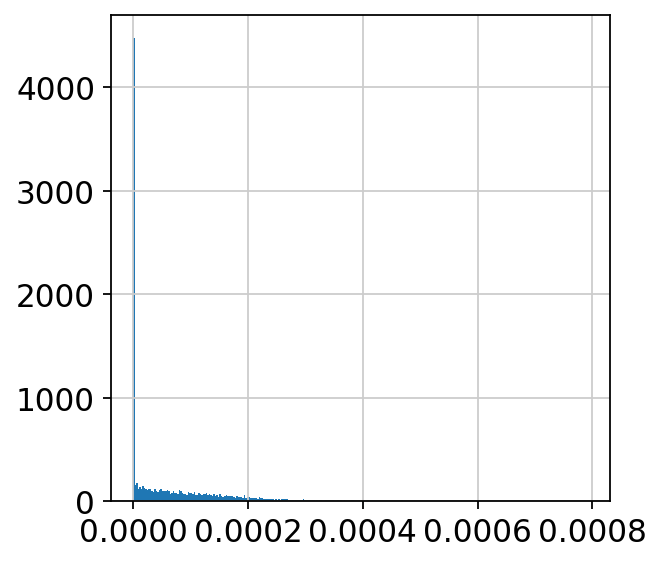

In [22]:
# Plot spectra fro cNMF 1
plt.hist(df[1], bins=300)  # note the address by integer column names rather than position
plt.show()

In [23]:
# Manhattan plot

In [24]:
# Order chromosome groups
df.chr = df.chr.astype('category')

# set order
df.chr = df.chr.cat.set_categories(
    ['chr%i' %i for i in range(1, 23)] + ['chrX']
)

# Order dataframe by chromosome
df = df.sort_values('chr')

In [25]:
df

,chr,bp_from,bp_to,gene_symbol,peak_anno,1,2,3,4,5,6,7,8,9,10,11,12,13,14
"chr1:827241-827741,LINC00115,Promoter",chr1,827241,827741,LINC00115,Promoter,0.000119,0.000044,0.000046,1.688904e-05,0.000135,0.000429,0.000061,0.000128,0.000124,0.000110,0.000082,0.000138,0.000093,8.968862e-05
"chr1:175267634-175268134,KIAA0040,Distal",chr1,175267634,175268134,KIAA0040,Distal,0.000028,0.000278,0.000185,4.690659e-06,0.000332,0.000100,0.000266,0.000209,0.000000,0.000054,0.000230,0.000130,0.000000,4.225631e-04
"chr1:175273515-175274015,KIAA0040,Distal",chr1,175273515,175274015,KIAA0040,Distal,0.000000,0.000175,0.000137,0.000000e+00,0.000121,0.000000,0.000128,0.000006,0.000000,0.000000,0.000072,0.000018,0.000000,1.060191e-04
"chr1:175317653-175318153,KIAA0040,Exonic",chr1,175317653,175318153,KIAA0040,Exonic,0.000000,0.000006,0.000118,0.000000e+00,0.000000,0.000000,0.000000,0.000122,0.000004,0.000000,0.000707,0.000120,0.000000,1.969808e-05
"chr1:175433614-175434114,KIAA0040,Intronic",chr1,175433614,175434114,KIAA0040,Intronic,0.000016,0.000336,0.000000,2.492985e-05,0.000000,0.000000,0.000000,0.000000,0.000007,0.000242,0.000023,0.000000,0.000000,1.317149e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"chrX:45824463-45824963,LINC02595,Distal",chrX,45824463,45824963,LINC02595,Distal,0.000377,0.000012,0.000000,9.565330e-05,0.000000,0.000000,0.000000,0.000071,0.000011,0.000077,0.000017,0.000013,0.000000,7.150268e-06
"chrX:46601192-46601692,CHST7,Exonic",chrX,46601192,46601692,CHST7,Exonic,0.000000,0.000224,0.000025,1.028948e-04,0.000099,0.000000,0.000025,0.000070,0.000000,0.000084,0.000056,0.000000,0.000136,2.267117e-04
"chrX:46628010-46628510,CHST7,Intronic",chrX,46628010,46628510,CHST7,Intronic,0.000037,0.000203,0.000000,4.568863e-05,0.000027,0.000037,0.000034,0.000086,0.000042,0.000014,0.000047,0.000147,0.000000,2.242523e-04
"chrX:40310022-40310522,LOC101927476,Distal",chrX,40310022,40310522,LOC101927476,Distal,0.000046,0.000000,0.000437,2.844561e-07,0.000000,0.000000,0.000000,0.000000,0.000099,0.000000,0.000121,0.000000,0.000108,8.999964e-07


# Differential peak accessibility for S5-associated factor, stratified by cell type

In [26]:
adata

AnnData object with n_obs × n_vars = 56689 × 407383
    obs: 'BlacklistRatio', 'DoubletEnrichment', 'DoubletScore', 'nDiFrags', 'nFrags', 'nMonoFrags', 'nMultiFrags', 'NucleosomeRatio', 'PromoterRatio', 'ReadsInBlacklist', 'ReadsInPromoter', 'ReadsInTSS', 'Sample_x', 'TSSEnrichment', 'Clusters', 'predictedCell_Un', 'predictedGroup_Un', 'predictedScore_Un', 'predictedCell_Co', 'predictedGroup_Co', 'predictedScore_Co', 'Clusters_hm', 'predictedCell_Un_hm', 'predictedGroup_Un_hm', 'predictedScore_Un_hm', 'predictedCell_Co_hm', 'predictedGroup_Co_hm', 'predictedScore_Co_hm', 'predictedCell', 'predictedGroup', 'predictedScore', 'Annot', 'Clusters1', 'ReadsInPeaks', 'FRIP', 'GEX_SID', 'ATAC_SID', 'GEX', 'ATAC', 'Sample_y', 'DOB', 'Gender', 'date', 'age_years', 'state', 'disease', 'site_taken_fine', 'site_taken_broad', 'sorted', 'Nancy_histologic_score', 'slide_look_other', 'whole_tissue_signature', 'scSeq', 'bulkSeq', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 

## cNMF threshold

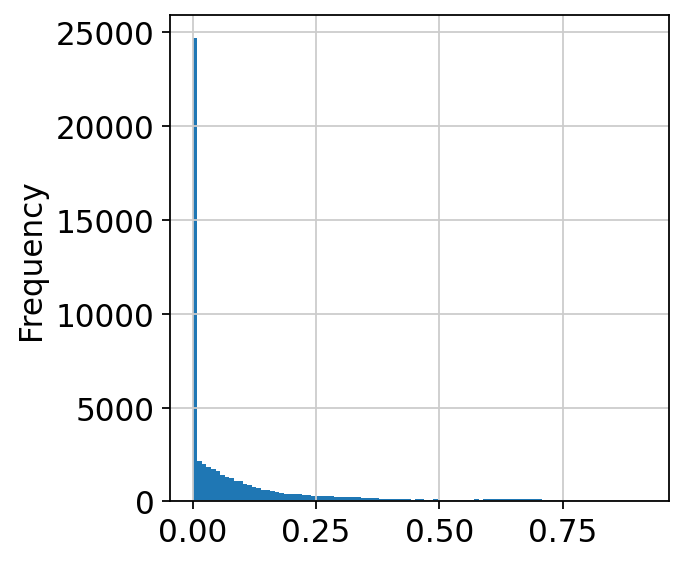

In [27]:
adata.obs.cNMF_1.plot.hist(bins=100)
plt.show()

In [28]:
thresh = 0.1
adata.obs['cNMF_1_thresh'] = (adata.obs.cNMF_1 > thresh).astype('category')

In [29]:
# Construct subroups based on cNMF activitiy threshold
adata.obs['annot1_S5'] = adata.obs.annot1.astype(str) + adata.obs.cNMF_1_thresh.map({True: '_NMF+', False: '_NMF-'}).astype(str)

adata.obs.annot1_S5 = adata.obs.annot1_S5.astype('category')

adata.obs.annot1_S5.value_counts()


S3_NMF-     13737
S1_NMF-     12606
S1_NMF+      5526
S2_NMF-      5054
S5_NMF+      4808
S3x_NMF-     3479
MF1_NMF-     2951
S2_NMF+      2398
S3_NMF+      2054
MF1_NMF+     1184
PC_NMF-      1172
S4_NMF-       800
PC_NMF+       506
S3x_NMF+      340
S5_NMF-        73
S4_NMF+         1
Name: annot1_S5, dtype: int64

In [30]:
# Stratify AnnData objects by cell type
adata_bycell = [adata[adata.obs.annot1 == g] for g in adata.obs.annot1.cat.categories]

# Remove empty AnnData objects without cells of type
adata_bycell = list(filter(lambda x: x.shape[0] > 0, adata_bycell))

In [49]:
adata_bycell

[AnnData object with n_obs × n_vars = 18132 × 407383
     obs: 'BlacklistRatio', 'DoubletEnrichment', 'DoubletScore', 'nDiFrags', 'nFrags', 'nMonoFrags', 'nMultiFrags', 'NucleosomeRatio', 'PromoterRatio', 'ReadsInBlacklist', 'ReadsInPromoter', 'ReadsInTSS', 'Sample_x', 'TSSEnrichment', 'Clusters', 'predictedCell_Un', 'predictedGroup_Un', 'predictedScore_Un', 'predictedCell_Co', 'predictedGroup_Co', 'predictedScore_Co', 'Clusters_hm', 'predictedCell_Un_hm', 'predictedGroup_Un_hm', 'predictedScore_Un_hm', 'predictedCell_Co_hm', 'predictedGroup_Co_hm', 'predictedScore_Co_hm', 'predictedCell', 'predictedGroup', 'predictedScore', 'Annot', 'Clusters1', 'ReadsInPeaks', 'FRIP', 'GEX_SID', 'ATAC_SID', 'GEX', 'ATAC', 'Sample_y', 'DOB', 'Gender', 'date', 'age_years', 'state', 'disease', 'site_taken_fine', 'site_taken_broad', 'sorted', 'Nancy_histologic_score', 'slide_look_other', 'whole_tissue_signature', 'scSeq', 'bulkSeq', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito'

In [63]:
# Test differential peak accessibility by cNMF_1 +/- by cell type
for x in adata_bycell:
    
    # Conditions in which not to test for differentially accessible peaks        
    if x.obs.cNMF_1_thresh.astype(bool).sum() <=3:
        # Require at least 3 cells to be detected
        continue
    
    # Else
    sc.tl.rank_genes_groups(x, groupby='cNMF_1_thresh')
    #sc.tl.rank_genes_groups(x, groupby='cNMF_1_thresh', reference=False)

In [64]:
adata_bycell[4]

View of AnnData object with n_obs × n_vars = 801 × 407383
    obs: 'BlacklistRatio', 'DoubletEnrichment', 'DoubletScore', 'nDiFrags', 'nFrags', 'nMonoFrags', 'nMultiFrags', 'NucleosomeRatio', 'PromoterRatio', 'ReadsInBlacklist', 'ReadsInPromoter', 'ReadsInTSS', 'Sample_x', 'TSSEnrichment', 'Clusters', 'predictedCell_Un', 'predictedGroup_Un', 'predictedScore_Un', 'predictedCell_Co', 'predictedGroup_Co', 'predictedScore_Co', 'Clusters_hm', 'predictedCell_Un_hm', 'predictedGroup_Un_hm', 'predictedScore_Un_hm', 'predictedCell_Co_hm', 'predictedGroup_Co_hm', 'predictedScore_Co_hm', 'predictedCell', 'predictedGroup', 'predictedScore', 'Annot', 'Clusters1', 'ReadsInPeaks', 'FRIP', 'GEX_SID', 'ATAC_SID', 'GEX', 'ATAC', 'Sample_y', 'DOB', 'Gender', 'date', 'age_years', 'state', 'disease', 'site_taken_fine', 'site_taken_broad', 'sorted', 'Nancy_histologic_score', 'slide_look_other', 'whole_tissue_signature', 'scSeq', 'bulkSeq', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_m

In [68]:
annot1

'PC'

In [78]:
adata_bycell[3].obs.columns

Index(['BlacklistRatio', 'DoubletEnrichment', 'DoubletScore', 'nDiFrags',
       'nFrags', 'nMonoFrags', 'nMultiFrags', 'NucleosomeRatio',
       'PromoterRatio', 'ReadsInBlacklist', 'ReadsInPromoter', 'ReadsInTSS',
       'Sample_x', 'TSSEnrichment', 'Clusters', 'predictedCell_Un',
       'predictedGroup_Un', 'predictedScore_Un', 'predictedCell_Co',
       'predictedGroup_Co', 'predictedScore_Co', 'Clusters_hm',
       'predictedCell_Un_hm', 'predictedGroup_Un_hm', 'predictedScore_Un_hm',
       'predictedCell_Co_hm', 'predictedGroup_Co_hm', 'predictedScore_Co_hm',
       'predictedCell', 'predictedGroup', 'predictedScore', 'Annot',
       'Clusters1', 'ReadsInPeaks', 'FRIP', 'GEX_SID', 'ATAC_SID', 'GEX',
       'ATAC', 'Sample_y', 'DOB', 'Gender', 'date', 'age_years', 'state',
       'disease', 'site_taken_fine', 'site_taken_broad', 'sorted',
       'Nancy_histologic_score', 'slide_look_other', 'whole_tissue_signature',
       'scSeq', 'bulkSeq', 'n_counts', 'log1p_n_counts', 'n_gene

In [86]:
sc.get.rank_genes_groups_df(adata_bycell[0], group=None)

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,False,"chr3:182980311-182980811,DCUN1D1,Exonic",35.737759,2.237494,6.167453e-270,2.512516e-264
1,False,"chr1:178931847-178932347,ANGPTL1,Distal",29.135250,1.853033,5.645557e-182,1.149952e-176
2,False,"chr20:1863313-1863813,SIRPA,Distal",27.573282,2.013427,8.219126e-164,1.116111e-158
3,False,"chr14:75539398-75539898,BATF,Intronic",26.891253,2.483167,3.189858e-156,2.598988e-151
4,False,"chr17:56163095-56163595,ANKFN1,Intronic",26.883152,2.476013,3.933448e-156,2.670699e-151
...,...,...,...,...,...,...
814761,True,"chr17:56163095-56163595,ANKFN1,Intronic",-26.883152,-2.476013,3.933448e-156,2.670699e-151
814762,True,"chr14:75539398-75539898,BATF,Intronic",-26.891253,-2.483167,3.189858e-156,2.598988e-151
814763,True,"chr20:1863313-1863813,SIRPA,Distal",-27.573282,-2.013427,8.219126e-164,1.116111e-158
814764,True,"chr1:178931847-178932347,ANGPTL1,Distal",-29.135250,-1.853033,5.645557e-182,1.149952e-176


In [85]:
sc.get.rank_genes_groups_df(adata_bycell[4], group="S4")

,names,scores,logfoldchanges,pvals,pvals_adj
0,"chr7:143522414-143522914,TAS2R41,Exonic",14.486312,3.627600,2.027843e-42,4.464729e-41
1,"chr11:103316884-103317384,DYNC2H1,Intronic",14.435825,3.291287,3.584609e-42,7.827976e-41
2,"chr1:225817033-225817533,EPHX1,Intronic",13.817860,2.383206,3.903335e-39,7.663016e-38
3,"chr15:41698703-41699203,MIR626,Intronic",13.744731,3.638576,9.268676e-39,1.794800e-37
4,"chr1:183270473-183270973,LAMC2,Intronic",13.312257,3.005969,1.099605e-36,1.980811e-35
...,...,...,...,...,...
407378,"chr11:13318821-13319321,ARNTL,Intronic",-63.031528,-27.326036,0.000000e+00,0.000000e+00
407379,"chr10:109412917-109413417,XPNPEP1,Distal",-63.512524,-27.333370,0.000000e+00,0.000000e+00
407380,"chr21:18545830-18546330,TMPRSS15,Intronic",-64.349648,-27.338537,0.000000e+00,0.000000e+00
407381,"chr10:11586151-11586651,USP6NL,Intronic",-64.708664,-27.366417,0.000000e+00,0.000000e+00


In [80]:
sc.get.rank_genes_groups_df(adata_bycell[4], group="S4")

,names,scores,logfoldchanges,pvals,pvals_adj
0,"chr7:143522414-143522914,TAS2R41,Exonic",14.486312,3.627600,2.027843e-42,4.464729e-41
1,"chr11:103316884-103317384,DYNC2H1,Intronic",14.435825,3.291287,3.584609e-42,7.827976e-41
2,"chr1:225817033-225817533,EPHX1,Intronic",13.817860,2.383206,3.903335e-39,7.663016e-38
3,"chr15:41698703-41699203,MIR626,Intronic",13.744731,3.638576,9.268676e-39,1.794800e-37
4,"chr1:183270473-183270973,LAMC2,Intronic",13.312257,3.005969,1.099605e-36,1.980811e-35
...,...,...,...,...,...
407378,"chr11:13318821-13319321,ARNTL,Intronic",-63.031528,-27.326036,0.000000e+00,0.000000e+00
407379,"chr10:109412917-109413417,XPNPEP1,Distal",-63.512524,-27.333370,0.000000e+00,0.000000e+00
407380,"chr21:18545830-18546330,TMPRSS15,Intronic",-64.349648,-27.338537,0.000000e+00,0.000000e+00
407381,"chr10:11586151-11586651,USP6NL,Intronic",-64.708664,-27.366417,0.000000e+00,0.000000e+00


In [33]:
#adata_bycell[4].obs.annot1.cat.categories

In [34]:
# Get table of differential abundance statistics
#diff_tabs = [sc.get.rank_genes_groups_df(x, group=None) for x in adata_bycell]

In [90]:
# Get table of differential abundance statistics
diff_tabs = dict()
for i in range(len(adata_bycell)):
    # Check if only one cell type
    annot1 = adata_bycell[i].obs.annot1.cat.categories
    assert len(annot1 == 1)
    annot1 = annot1[0]  # first entry cast to hashable
    
    print(annot1)
    try:
        #diff_tabs[annot1] = sc.get.rank_genes_groups_df(adata_bycell[i], group=str(annot1))
        #diff_tabs[annot1] = sc.get.rank_genes_groups_df(adata_bycell[i], group=None)
        diff_tabs[annot1] = sc.get.rank_genes_groups_df(adata_bycell[i], group='True')  # group value of cNMF_1>treshold

        diff_tabs[annot1]['annot1'] = annot1  # store cell annotation
    except Exception as e:
        print(e)

S1
S2
S3
S3x
S4
"None of [Index(['True'], dtype='object')] are in the [columns]"
S5
MF1
PC


In [91]:
diff_tabs

{'S1':                                             names     scores  logfoldchanges  \
 0          chr4:165524624-165525124,MIR578,Distal  27.970850        3.249020   
 1            chr3:60935659-60936159,FHIT,Intronic  25.665157        2.902387   
 2       chr1:209607303-209607803,MIR4260,Intronic  25.485497        3.101262   
 3          chr15:75579115-75579615,PTPN9,Promoter  25.407637        2.496163   
 4         chr14:102516739-102517239,ANKRD9,Distal  24.982367        2.938395   
 ...                                           ...        ...             ...   
 407378    chr17:56163095-56163595,ANKFN1,Intronic -26.883152       -2.476013   
 407379      chr14:75539398-75539898,BATF,Intronic -26.891253       -2.483167   
 407380         chr20:1863313-1863813,SIRPA,Distal -27.573282       -2.013427   
 407381    chr1:178931847-178932347,ANGPTL1,Distal -29.135250       -1.853033   
 407382    chr3:182980311-182980811,DCUN1D1,Exonic -35.737759       -2.237494   
 
                 pva

In [92]:
diff_tabs_all = pd.concat(diff_tabs)

In [37]:
#diff_tabs_all = diff_tabs_all.drop(columns='group')

In [93]:
diff_tabs_all

names     scores  \
S1 0                chr4:165524624-165525124,MIR578,Distal  27.970850   
   1                  chr3:60935659-60936159,FHIT,Intronic  25.665157   
   2             chr1:209607303-209607803,MIR4260,Intronic  25.485497   
   3                chr15:75579115-75579615,PTPN9,Promoter  25.407637   
   4               chr14:102516739-102517239,ANKRD9,Distal  24.982367   
...                                                    ...        ...   
PC 407378  chr11:100704118-100704618,LOC100128386,Intronic -13.224223   
   407379            chr2:46941538-46942038,MCFD2,Promoter -14.322875   
   407380         chr12:53491710-53492210,MAP3K12,Intronic -14.522072   
   407381      chr11:69981408-69981908,LOC101928443,Distal -16.014854   
   407382            chr1:16128134-16128634,EPHA2,Intronic -16.302145   

           logfoldchanges          pvals      pvals_adj annot1  
S1 0             3.249020  3.163872e-162  3.222269e-157     S1  
   1             2.902387  2.453428e-138  6.246780e-134     S1  
   2             3.101262  1.998190e-136  4.522381e-132     S1  
   3             2.496163  6.037707e-136  1.229830e-131     S1  
   4             2.938395  1.879851e-131  3.329649e-127     S1  
...                   ...            ...            ...    ...  
PC 407378       -2.440604   5.684109e-38   4.014564e-33     PC  
   407379       -3.307722   6.456698e-44   6.575872e-39     PC  
   407380       -3.065253   4.269161e-45   5.797279e-40     PC  
   407381       -4.089944   1.546039e-53   3.149150e-48     PC  
   407382       -3.014496   1.783591e-55   7.266048e-50     PC  

[2851681 rows x 6 columns]

In [94]:
# Filter based on P values (to reduce file size)
diff_tabs_all = diff_tabs_all[diff_tabs_all.pvals < 0.01]

In [95]:
diff_tabs_all

names     scores  \
S1 0                chr4:165524624-165525124,MIR578,Distal  27.970850   
   1                  chr3:60935659-60936159,FHIT,Intronic  25.665157   
   2             chr1:209607303-209607803,MIR4260,Intronic  25.485497   
   3                chr15:75579115-75579615,PTPN9,Promoter  25.407637   
   4               chr14:102516739-102517239,ANKRD9,Distal  24.982367   
...                                                    ...        ...   
PC 407378  chr11:100704118-100704618,LOC100128386,Intronic -13.224223   
   407379            chr2:46941538-46942038,MCFD2,Promoter -14.322875   
   407380         chr12:53491710-53492210,MAP3K12,Intronic -14.522072   
   407381      chr11:69981408-69981908,LOC101928443,Distal -16.014854   
   407382            chr1:16128134-16128634,EPHA2,Intronic -16.302145   

           logfoldchanges          pvals      pvals_adj annot1  
S1 0             3.249020  3.163872e-162  3.222269e-157     S1  
   1             2.902387  2.453428e-138  6.246780e-134     S1  
   2             3.101262  1.998190e-136  4.522381e-132     S1  
   3             2.496163  6.037707e-136  1.229830e-131     S1  
   4             2.938395  1.879851e-131  3.329649e-127     S1  
...                   ...            ...            ...    ...  
PC 407378       -2.440604   5.684109e-38   4.014564e-33     PC  
   407379       -3.307722   6.456698e-44   6.575872e-39     PC  
   407380       -3.065253   4.269161e-45   5.797279e-40     PC  
   407381       -4.089944   1.546039e-53   3.149150e-48     PC  
   407382       -3.014496   1.783591e-55   7.266048e-50     PC  

[643240 rows x 6 columns]

In [41]:
#np.sum(diff_tabs_all.pvals < 0.01)

In [96]:
diff_tabs_all.to_csv("data/ATACseq_cNMF1_diff_peak.csv", index=False)

In [43]:
# Get top marker tables
top_peaks = [diff_tabs[key][0:10] for key in diff_tabs]

top_peaks = pd.concat(top_peaks)

top_peaks.names

0        chr4:165524624-165525124,MIR578,Distal
1          chr3:60935659-60936159,FHIT,Intronic
2     chr1:209607303-209607803,MIR4260,Intronic
3        chr15:75579115-75579615,PTPN9,Promoter
4       chr14:102516739-102517239,ANKRD9,Distal
                        ...                    
5         chr10:70559896-70560396,PRF1,Intronic
6    chr15:71295072-71295572,THSD4-AS1,Intronic
7        chr15:75579115-75579615,PTPN9,Promoter
8        chr11:36309025-36309525,PRR5L,Intronic
9     chr10:70406238-70406738,EIF4EBP2,Intronic
Name: names, Length: 80, dtype: object

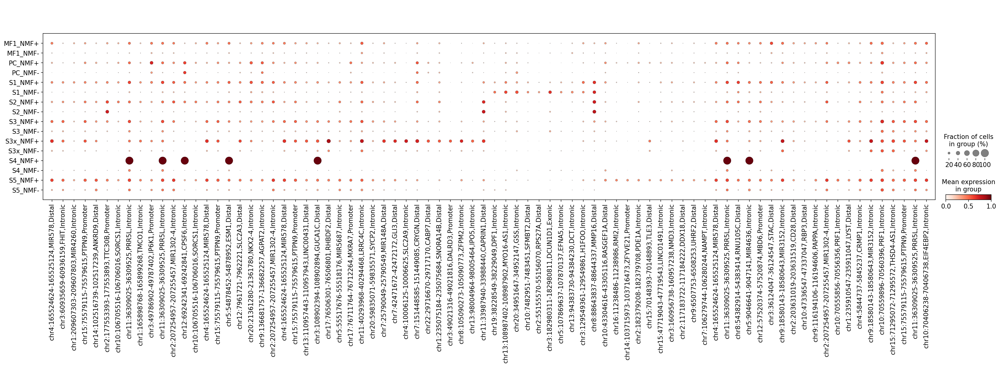

In [44]:
sc.pl.dotplot(adata, groupby='annot1_S5', var_names=top_peaks.names, vmax=1)

In [45]:
adata

AnnData object with n_obs × n_vars = 56689 × 407383
    obs: 'BlacklistRatio', 'DoubletEnrichment', 'DoubletScore', 'nDiFrags', 'nFrags', 'nMonoFrags', 'nMultiFrags', 'NucleosomeRatio', 'PromoterRatio', 'ReadsInBlacklist', 'ReadsInPromoter', 'ReadsInTSS', 'Sample_x', 'TSSEnrichment', 'Clusters', 'predictedCell_Un', 'predictedGroup_Un', 'predictedScore_Un', 'predictedCell_Co', 'predictedGroup_Co', 'predictedScore_Co', 'Clusters_hm', 'predictedCell_Un_hm', 'predictedGroup_Un_hm', 'predictedScore_Un_hm', 'predictedCell_Co_hm', 'predictedGroup_Co_hm', 'predictedScore_Co_hm', 'predictedCell', 'predictedGroup', 'predictedScore', 'Annot', 'Clusters1', 'ReadsInPeaks', 'FRIP', 'GEX_SID', 'ATAC_SID', 'GEX', 'ATAC', 'Sample_y', 'DOB', 'Gender', 'date', 'age_years', 'state', 'disease', 'site_taken_fine', 'site_taken_broad', 'sorted', 'Nancy_histologic_score', 'slide_look_other', 'whole_tissue_signature', 'scSeq', 'bulkSeq', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 

In [46]:
sc.get.rank_genes_groups_df(adata_bycell[1], group=None)

,names,scores,logfoldchanges,pvals,pvals_adj
0,"chr11:36309025-36309525,PRR5L,Intronic",19.553953,3.192222,8.266895e-80,9.102142e-76
1,"chr2:207254957-207255457,MIR1302-4,Intronic",18.892088,2.562905,2.803502e-75,2.379373e-71
2,"chr12:69242341-69242841,CPSF6,Intronic",18.131674,2.938436,1.408851e-69,8.566296e-66
3,"chr10:106705516-106706016,SORCS1,Intronic",18.083712,2.880049,2.956298e-69,1.745428e-65
4,"chr4:165524624-165525124,MIR578,Distal",16.898226,3.846781,7.460220e-61,2.450941e-57
...,...,...,...,...,...
407378,"chr9:127664718-127665218,MIR3911,Intronic",-21.471315,-2.322689,2.992195e-99,2.437939e-94
407379,"chr17:65143618-65144118,RGS9,Intronic",-21.524187,-2.349476,9.777435e-100,9.957902e-95
407380,"chr6:158011474-158011974,SYNJ2-IT1,Intronic",-21.946180,-1.969023,2.422189e-103,3.289195e-98
407381,"chr2:216348909-216349409,MARCH4,Intronic",-22.099785,-2.009991,9.341820e-105,1.902849e-99


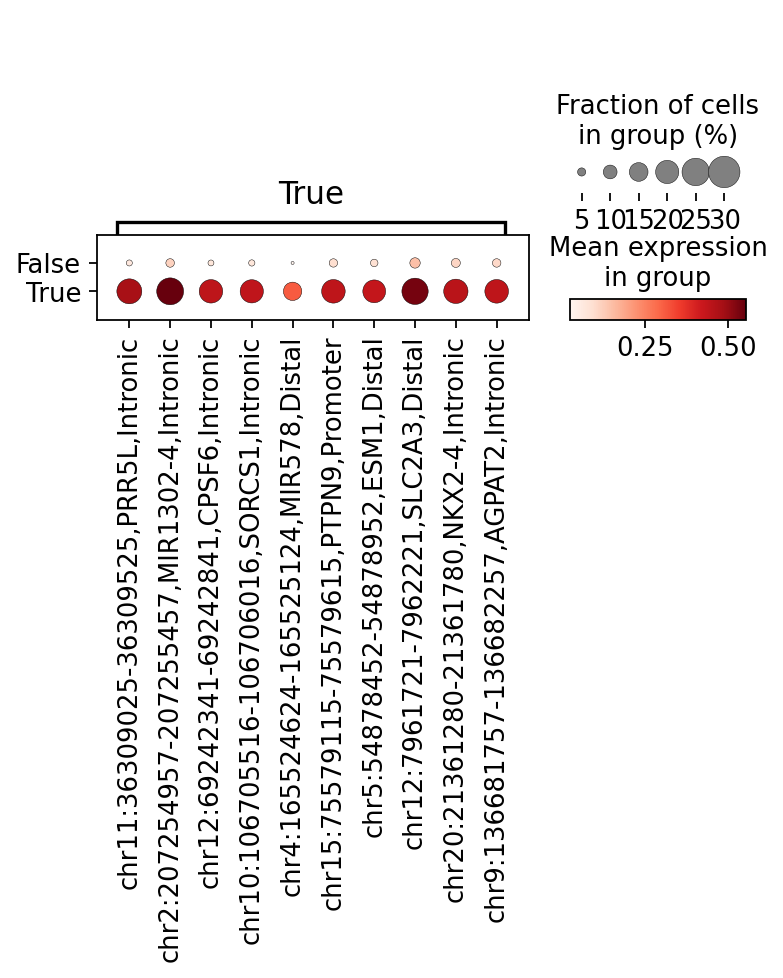

In [47]:
sc.pl.rank_genes_groups_dotplot(adata_bycell[1])

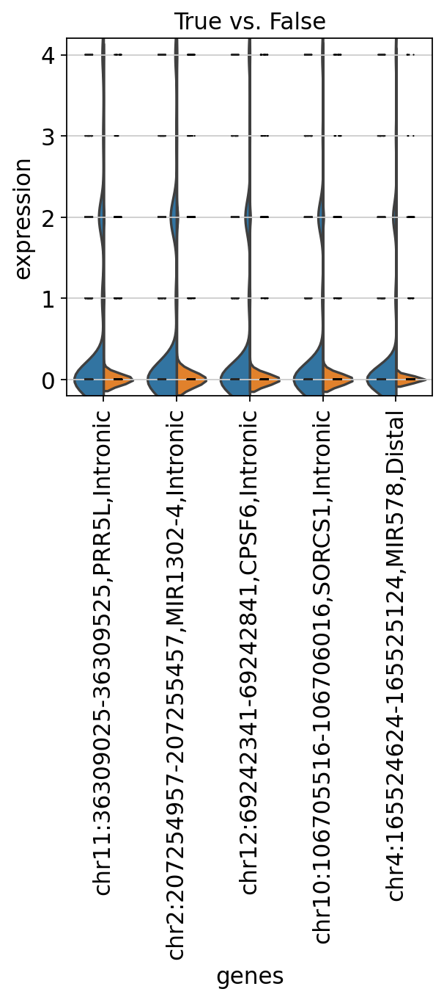

In [48]:
sc.pl.rank_genes_groups_violin(adata_bycell[1], n_genes=5)